<a href="https://colab.research.google.com/github/AshikaAnand12/ForestFirePrediction/blob/main/Copy_of_CMPE_255_forest_fire_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Forest Fire Prediction**

* Team: Free Thinkers
* Team Members: Aman Shah, Anusha Gangasani, Ashika Anand Babu, Ramya Mahesh

## Summary of Analysis
1. Using open source dataset we predict the location where forest fire might occur next which can be used as an alert for the residents

## References
Link: https://cppsecrets.com/users/5271114105115104979810446114107495548525364103109971051084699111109/Advanced-Project-Forest-Fire-Prediction-using-SVR-Random-Forest-and-Deep-NN.php

Link: https://www.analyticsvidhya.com/blog/2021/10/forest-fire-prediction-using-machine-learning/

# **Connection with Drive**

Import the datasets from the Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"

In [ ]:
%cd "/content/gdrive/My Drive/Kaggle"

[Errno 2] No such file or directory: '/content/gdrive/My Drive/Kaggle'
/content


# **Import Packages**

In [ ]:
import numpy as np
import pandas as pd


In [ ]:
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

In [ ]:
#import sklearn libraries for the model 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor


In [ ]:
#import data visualization libraries
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV 

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# **Load Data**

In [ ]:
forest_fire_df = pd.read_csv('/content/combined_csv.csv')
forest_fire_df

# **Understanding and Preprocessing Data**

## Data Info

In [ ]:
forest_fire_df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight
0,28.59904,-17.93748,320.31,3.73,1.81,2021-12-05,00:00,T,100,6.1NRT,287.31,123.13,N
1,28.61983,-17.87544,319.83,3.78,1.82,2021-12-05,00:00,T,99,6.1NRT,282.10,142.70,N
2,-14.97483,143.47408,328.09,1.03,1.01,2021-12-05,00:45,T,47,6.1NRT,307.97,11.28,D
3,-14.98529,143.48222,325.15,1.03,1.01,2021-12-05,00:45,T,39,6.1NRT,307.51,7.85,D
4,-14.61875,143.95247,335.98,1.05,1.02,2021-12-05,00:45,T,83,6.1NRT,305.43,23.25,D


In [ ]:
forest_fire_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312658 entries, 0 to 312657
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    312658 non-null  float64
 1   longitude   312658 non-null  float64
 2   brightness  312658 non-null  float64
 3   scan        312658 non-null  float64
 4   track       312658 non-null  float64
 5   acq_date    312658 non-null  object 
 6   acq_time    312658 non-null  object 
 7   satellite   312658 non-null  object 
 8   confidence  312658 non-null  int64  
 9   version     312658 non-null  object 
 10  bright_t31  312657 non-null  float64
 11  frp         312657 non-null  float64
 12  daynight    312657 non-null  object 
dtypes: float64(7), int64(1), object(5)
memory usage: 31.0+ MB


In [ ]:
forest_fire_df.describe()

,latitude,longitude,brightness,scan,track,confidence,bright_t31,frp
count,312658.000000,312658.000000,312658.000000,312658.000000,312658.000000,312658.000000,312657.000000,312657.000000
mean,1.852019,19.968843,327.209917,1.586546,1.206647,66.990453,301.241950,41.567369
std,20.952878,63.017352,17.025812,0.785337,0.238255,20.592644,10.009563,87.048026
min,-53.223660,-176.135090,300.000000,1.000000,1.000000,0.000000,264.780000,0.000000
25%,-15.540677,-38.336457,316.280000,1.050000,1.020000,54.000000,294.810000,11.570000
50%,-3.334635,26.552800,325.490000,1.240000,1.110000,69.000000,301.950000,20.700000
75%,11.800970,44.085248,334.560000,1.820000,1.320000,82.000000,308.240000,41.760000
max,80.307800,179.600400,507.820000,4.820000,2.000000,100.000000,400.070000,5458.550000


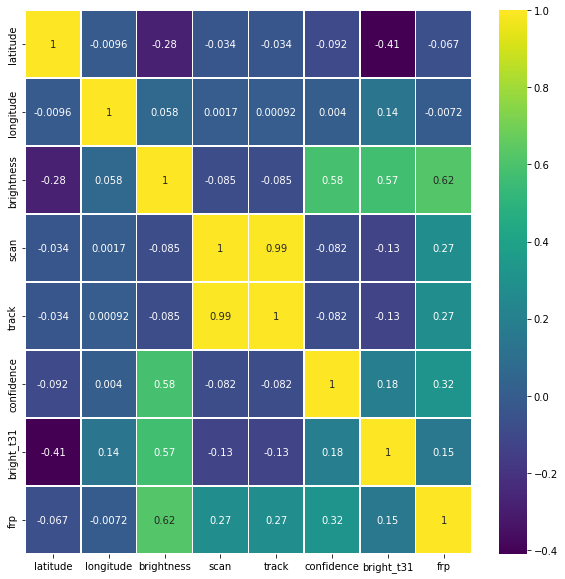

In [ ]:
#Plot heat map to get the understanding of the data
plt.figure(figsize=(10, 10))
sns.heatmap(forest_fire_df.corr(),annot=True,cmap='viridis',linewidths=.5)

## Missing Data

In [ ]:
#check for missing Data
def missing_data(data):
    total = data.isnull().sum()
    percent = (data.isnull().sum()/data.isnull().count()*100)
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    types = []
    for col in data.columns:
        dtype = str(data[col].dtype)
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt))

In [ ]:
#Print the missing data for each column
missing_data(forest_fire_df)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight
Total,0,0,0,0,0,0,0,0,0,0,1,1,1
Percent,0,0,0,0,0,0,0,0,0,0,0.000319838,0.000319838,0.000319838
Types,float64,float64,float64,float64,float64,object,object,object,int64,object,float64,float64,object


In [ ]:
#check if there are any null values in each column
forest_fire_df.isna().sum()

latitude      0
longitude     0
brightness    0
scan          0
track         0
acq_date      0
acq_time      0
satellite     0
confidence    0
version       0
bright_t31    1
frp           1
daynight      1
dtype: int64

## Unique Values

In [ ]:
#calculate unique values for each feature
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

In [ ]:
#Get the total number of unique values for each feature
unique_values(forest_fire_df)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight
Total,312658,312658,312658,312658,312658,312658,312658,312658,312658,312658,312657,312657,312657
Uniques,300282,306766,8646,267,101,35,854,2,101,1,6510,24103,2


In [ ]:
#Droping version feature since all rows has same value
forest_fire_df.drop(['version'], axis = 1)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,bright_t31,frp,daynight
0,28.59904,-17.93748,320.31,3.73,1.81,2021-12-05,00:00,T,100,287.31,123.13,N
1,28.61983,-17.87544,319.83,3.78,1.82,2021-12-05,00:00,T,99,282.10,142.70,N
2,-14.97483,143.47408,328.09,1.03,1.01,2021-12-05,00:45,T,47,307.97,11.28,D
3,-14.98529,143.48222,325.15,1.03,1.01,2021-12-05,00:45,T,39,307.51,7.85,D
4,-14.61875,143.95247,335.98,1.05,1.02,2021-12-05,00:45,T,83,305.43,23.25,D
...,...,...,...,...,...,...,...,...,...,...,...,...
312653,-37.48090,-73.35231,307.82,1.36,1.16,2021-11-17,18:36,A,19,295.67,7.07,D
312654,-37.24431,-71.94182,316.07,1.17,1.07,2021-11-17,18:36,A,49,303.99,10.01,D
312655,-37.17578,-72.94579,313.33,1.29,1.13,2021-11-17,18:36,A,24,302.70,6.79,D
312656,-36.97162,-72.93362,313.04,1.28,1.12,2021-11-17,18:36,A,29,301.46,8.41,D


# **Feature Engineering**

In [ ]:
#create daynight map.
#daynight is 1 if its day and 0 if its night
daynight_map = {"D": 1, "N": 0}
forest_fire_df['daynight'] = forest_fire_df['daynight'].map(daynight_map)



In [ ]:
#create satellite map.
#satellite map is 1 if its Terra and 0 if its Aqua
satellite_map = {"T": 1, "A": 0}
forest_fire_df['satellite'] = forest_fire_df['satellite'].map(satellite_map)


In [ ]:
#check the dataset after adding new features daynight_map and satellite_map
forest_fire_df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight
0,28.59904,-17.93748,320.31,3.73,1.81,2021-12-05,00:00,1,100,6.1NRT,287.31,123.13,0.0
1,28.61983,-17.87544,319.83,3.78,1.82,2021-12-05,00:00,1,99,6.1NRT,282.10,142.70,0.0
2,-14.97483,143.47408,328.09,1.03,1.01,2021-12-05,00:45,1,47,6.1NRT,307.97,11.28,1.0
3,-14.98529,143.48222,325.15,1.03,1.01,2021-12-05,00:45,1,39,6.1NRT,307.51,7.85,1.0
4,-14.61875,143.95247,335.98,1.05,1.02,2021-12-05,00:45,1,83,6.1NRT,305.43,23.25,1.0


In [ ]:
print("Scan Values")
print(forest_fire_df['scan'].value_counts())
print()
# Name: acq_date, Length: 61, dtype: int64 : 61 days data
print("Date when Data was acquired")
print(forest_fire_df['acq_date'].value_counts())
print()

Scan Values
1.00    25607
1.01    18462
1.02    12890
1.03    10154
1.04     8904
        ...  
4.11      244
4.79      236
4.57      233
4.47      233
4.82      225
Name: scan, Length: 267, dtype: int64

Date when Data was acquired
2021-10-10    12750
2021-10-08    12749
2021-10-15    12446
2021-10-22    11691
2021-10-14    11511
2021-10-31    11471
2021-11-23    10401
2021-10-09     9983
2021-11-24     9755
2021-11-14     9660
2021-11-25     9527
2021-11-18     9478
2021-11-02     9324
2021-11-19     9252
2021-10-07     9153
2021-12-05     8985
2021-10-27     8685
2021-10-28     8608
2021-10-26     8592
2021-10-21     8548
2021-11-06     8189
2021-12-06     8132
2021-11-26     8106
2021-10-11     7868
2021-11-13     7851
2021-10-20     7811
2021-11-10     7708
2021-11-03     7080
2021-12-03     6971
2021-11-27     6894
2021-10-18     6788
2021-10-25     6784
2021-11-17     6774
2021-10-30     6609
2021-11-12     6524
Name: acq_date, dtype: int64



# **Visualise Data**

In [ ]:
#Extract acquired date
forest_fire_df['acq_date'] = pd.to_datetime(forest_fire_df['acq_date'])

In [ ]:
#Extract month from acquired date
forest_fire_df['month'] = forest_fire_df['acq_date'].dt.month
forest_fire_df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,month
0,28.59904,-17.93748,320.31,3.73,1.81,2021-12-05,00:00,1,100,6.1NRT,287.31,123.13,0.0,12
1,28.61983,-17.87544,319.83,3.78,1.82,2021-12-05,00:00,1,99,6.1NRT,282.10,142.70,0.0,12
2,-14.97483,143.47408,328.09,1.03,1.01,2021-12-05,00:45,1,47,6.1NRT,307.97,11.28,1.0,12
3,-14.98529,143.48222,325.15,1.03,1.01,2021-12-05,00:45,1,39,6.1NRT,307.51,7.85,1.0,12
4,-14.61875,143.95247,335.98,1.05,1.02,2021-12-05,00:45,1,83,6.1NRT,305.43,23.25,1.0,12


Plot the number of forest fires according to month

In [ ]:
#Plotting the forest fire by month
v1 = pd.DataFrame(forest_fire_df['month'].value_counts().reset_index(name='counts'))
v1 = v1[v1['index'] != 0]
v1
import plotly.graph_objects as go
data = {
   "values": v1['counts'],
   "labels": v1['index'],
   "domain": {"column": 0},
   "name": "Month",
   "hoverinfo":"label+percent+name",
   "hole": .4,
   "type": "pie"
}
layout = go.Layout(title="<b>All Months in data</b>", legend=dict(x=0.1, y=1.1, orientation="h"))

data = [data]
fig = go.Figure(data = data, layout = layout)
fig.update_layout(title_x=0.5)
fig.show()


In [ ]:
#Round off brighntess and frp values
forest_fire_df.bright_t31 = forest_fire_df.bright_t31.round()
forest_fire_df.brightness = forest_fire_df.brightness.round()
forest_fire_df.frp = forest_fire_df.frp.round()

## **Plot if confidence > 80**

In [ ]:
#Plot the forest fire where the confidence level is greater than 80
forest_fire_df['name_match'] = forest_fire_df['confidence'].apply(lambda x: 'Match' if x > 70 else 'Mismatch')
print (forest_fire_df)

        latitude  longitude  brightness  ...  daynight  month name_match
0       28.59904  -17.93748       320.0  ...       0.0     12      Match
1       28.61983  -17.87544       320.0  ...       0.0     12      Match
2      -14.97483  143.47408       328.0  ...       1.0     12   Mismatch
3      -14.98529  143.48222       325.0  ...       1.0     12   Mismatch
4      -14.61875  143.95247       336.0  ...       1.0     12      Match
...          ...        ...         ...  ...       ...    ...        ...
312653 -37.48090  -73.35231       308.0  ...       1.0     11   Mismatch
312654 -37.24431  -71.94182       316.0  ...       1.0     11   Mismatch
312655 -37.17578  -72.94579       313.0  ...       1.0     11   Mismatch
312656 -36.97162  -72.93362       313.0  ...       1.0     11   Mismatch
312657 -36.43438  -71.96148       318.0  ...       NaN     11   Mismatch

[312658 rows x 15 columns]


In [ ]:
#Add required fields for visualization 
df_filtered = forest_fire_df[forest_fire_df['name_match'] == 'Match']

In [ ]:
#Final output 
df_filtered

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,month,name_match
0,28.59904,-17.93748,320.0,3.73,1.81,2021-12-05,00:00,1,100,6.1NRT,287.0,123.0,0.0,12,Match
1,28.61983,-17.87544,320.0,3.78,1.82,2021-12-05,00:00,1,99,6.1NRT,282.0,143.0,0.0,12,Match
4,-14.61875,143.95247,336.0,1.05,1.02,2021-12-05,00:45,1,83,6.1NRT,305.0,23.0,1.0,12,Match
5,-14.62011,143.96217,344.0,1.05,1.03,2021-12-05,00:45,1,90,6.1NRT,307.0,37.0,1.0,12,Match
7,-14.46001,143.73251,333.0,1.04,1.02,2021-12-05,00:45,1,71,6.1NRT,305.0,19.0,1.0,12,Match
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312640,-30.59291,-71.46535,329.0,1.01,1.01,2021-11-17,18:36,0,73,6.1NRT,315.0,11.0,1.0,11,Match
312641,-30.58239,-71.45649,339.0,1.01,1.01,2021-11-17,18:36,0,86,6.1NRT,312.0,27.0,1.0,11,Match
312642,-30.58384,-71.46704,331.0,1.01,1.01,2021-11-17,18:36,0,75,6.1NRT,313.0,13.0,1.0,11,Match
312647,-38.48062,-72.49129,316.0,1.27,1.12,2021-11-17,18:36,0,71,6.1NRT,297.0,15.0,1.0,11,Match


In [ ]:
#Print the confidence levels
print(df_filtered['confidence'].value_counts())

100    19409
71      6268
72      6243
75      6197
74      6014
73      5970
77      5904
76      5888
78      5666
79      5613
80      5390
81      5252
82      5095
83      4815
84      4578
85      4564
86      4290
87      4259
88      3733
89      3673
90      3430
91      3185
94      3081
92      3025
93      2744
95      2371
96      2227
97      1930
98      1881
99      1705
Name: confidence, dtype: int64


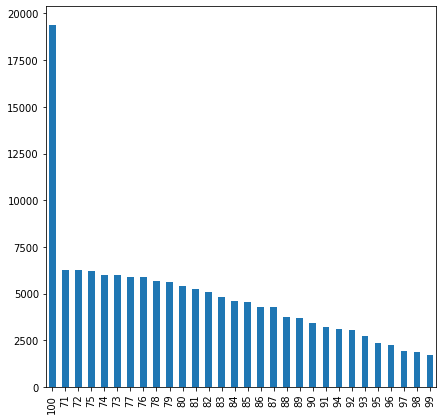

In [ ]:
#Plot the obtained values 
plt.figure(figsize=(7,7))
df_filtered['confidence'].value_counts().plot(kind='bar')

## **Plot state wise in and around USA**




In [ ]:
#Plot state wise in and around USA
#Read the file
df2 = pd.read_csv('/content/usfd.csv')

In [ ]:
#Obtain country, state info from the longitudes
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
def city_state_country(row):
    coord = f"{row['latitude']}, {row['longitude']}"
    print(coord)
    if(type(geolocator.reverse(coord)) != str):
      pass
    location = geolocator.reverse(coord, exactly_one=True)
    address = location.raw['address']
    city = address.get('city', '')
    state = address.get('state', '')
    country = address.get('country', '')
    row['city'] = city
    row['state'] = state
    row['country'] = country
    return row

df2 = df2.apply(city_state_country, axis=1)
print(df2)

In [ ]:
v2 = pd.DataFrame(df2['country'].value_counts().reset_index(name='counts'))
v2 = v2[v2['index'] != 0]
v2

,index,counts
0,United States,149
1,México,79
2,Canada,15
3,República Dominicana,5


In [ ]:
#Plot the graph with countries
import plotly.graph_objects as go
data = {
   "values": v2['counts'],
   "labels": v2['index'],
   "domain": {"column": 0},
   "name": "Countries",
   "hoverinfo":"label+percent+name",
   "hole": .4,
   "type": "pie"
}
layout = go.Layout(title="<b>Ratio of Countries data</b>", legend=dict(x=0.1, y=1.1, orientation="h"))

data = [data]
fig = go.Figure(data = data, layout = layout)
fig.update_layout(title_x=0.5)
fig.show()

In [ ]:
df3 = df2.loc[df2['country'] == 'United States']

In [ ]:
df3

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,city,state,country
0,19.39759,-155.31044,333.00,3.95,1.85,2021-10-11,00:24,A,80,6.1NRT,289.44,224.98,D,,Hawaii,United States
1,19.40784,-155.28192,328.69,3.97,1.85,2021-10-11,00:24,A,60,6.1NRT,288.65,179.95,D,,Hawaii,United States
4,35.28571,-90.80164,318.26,4.41,1.93,2021-10-11,03:15,T,97,6.1NRT,292.25,135.12,N,,Arkansas,United States
5,35.28721,-90.80898,319.32,4.41,1.93,2021-10-11,03:15,T,98,6.1NRT,292.29,145.15,N,,Arkansas,United States
6,40.38953,-79.85334,300.00,1.00,1.00,2021-10-11,03:17,T,5,6.1NRT,288.45,4.68,N,,Pennsylvania,United States
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,47.45608,-124.04138,313.88,2.60,1.55,2021-10-11,21:59,A,0,6.1NRT,282.95,54.39,D,,Washington,United States
231,19.40124,-155.29807,360.31,1.38,1.16,2021-10-11,23:29,A,100,6.1NRT,306.20,121.11,D,,Hawaii,United States
232,19.40332,-155.28545,467.54,1.37,1.16,2021-10-11,23:29,A,100,6.1NRT,335.83,1527.25,D,,Hawaii,United States
233,19.39305,-155.28343,343.24,1.37,1.16,2021-10-11,23:29,A,83,6.1NRT,304.90,63.94,D,,Hawaii,United States


<BarContainer object of 248 artists>

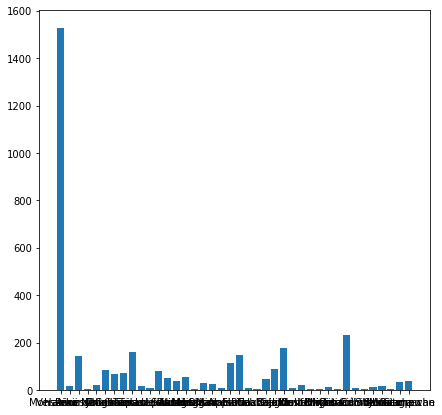

In [ ]:
plt.figure(figsize=(7,7))
plt.bar(df2['state'], df2['frp'])

In [ ]:
#Plot graph with respect to frp values
df4 = df2.nlargest(40,'frp')

In [ ]:
df4

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,city,state,country
232,19.40332,-155.28545,467.54,1.37,1.16,2021-10-11,23:29,A,100,6.1NRT,335.83,1527.25,D,,Hawaii,United States
220,19.40064,-155.26933,363.41,3.95,1.85,2021-10-11,20:19,T,94,6.1NRT,293.51,662.83,D,,Hawaii,United States
210,19.40399,-155.30672,338.48,3.97,1.85,2021-10-11,20:19,T,89,6.1NRT,296.07,259.46,D,,Hawaii,United States
208,49.93729,-118.37818,369.48,1.60,1.25,2021-10-11,20:19,A,94,6.1NRT,274.81,231.95,D,Area K (The Arrow Lakes),British Columbia,Canada
0,19.39759,-155.31044,333.00,3.95,1.85,2021-10-11,00:24,A,80,6.1NRT,289.44,224.98,D,,Hawaii,United States
223,49.93314,-118.39769,363.27,1.61,1.25,2021-10-11,20:19,A,75,6.1NRT,272.90,193.10,D,Area K (The Arrow Lakes),British Columbia,Canada
1,19.40784,-155.28192,328.69,3.97,1.85,2021-10-11,00:24,A,60,6.1NRT,288.65,179.95,D,,Hawaii,United States
226,34.50890,-120.13734,333.00,3.34,1.72,2021-10-11,21:55,A,85,6.1NRT,290.41,176.58,D,,California,United States
67,30.47337,-99.85803,350.65,2.02,1.38,2021-10-11,16:56,T,95,6.1NRT,301.60,160.74,D,,Texas,United States
109,30.92547,-86.47069,349.98,1.89,1.34,2021-10-11,16:56,T,96,6.1NRT,292.75,147.02,D,,Florida,United States


<BarContainer object of 40 artists>

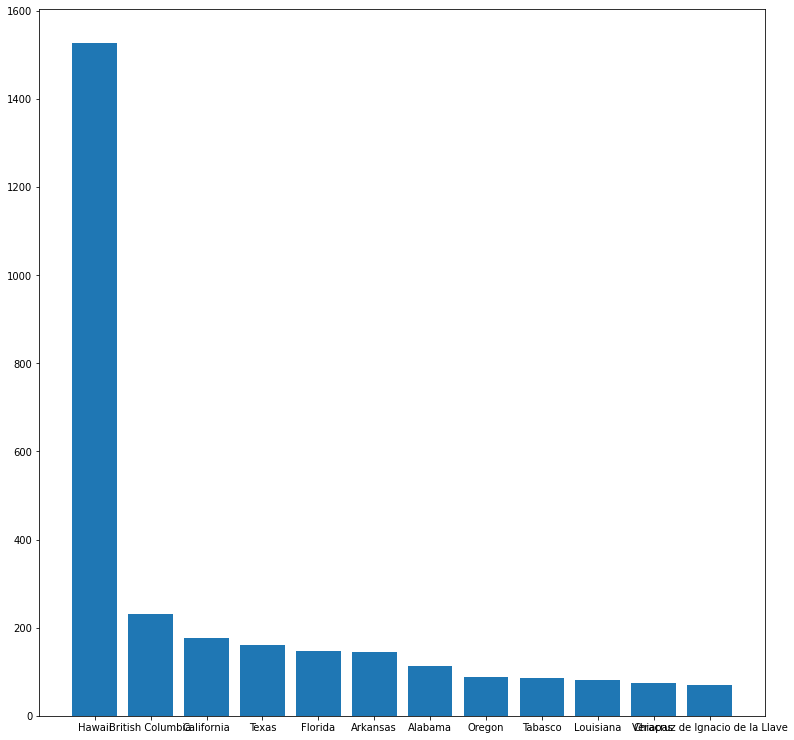

In [ ]:
#Plot the grap with country as x-axis and frp as y-axis
plt.figure(figsize=(13,13))
plt.bar(df4['state'], df4['frp'])

<BarContainer object of 248 artists>

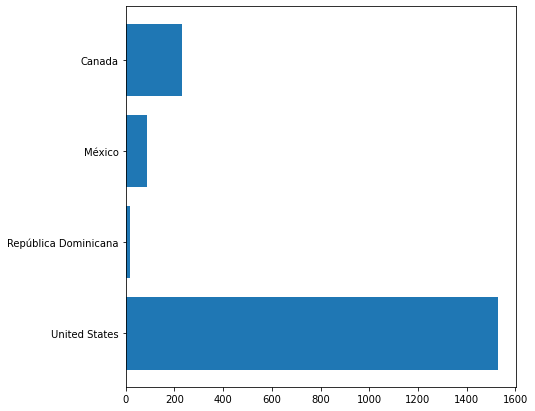

In [ ]:
plt.figure(figsize=(7,7))
plt.barh(df2['country'], df2['frp'])

<BarContainer object of 248 artists>

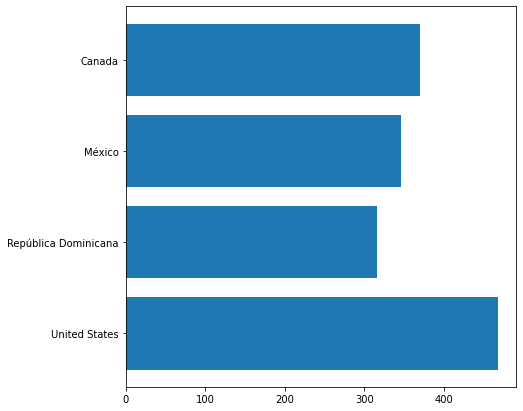

In [ ]:
plt.figure(figsize=(7,7))
plt.barh(df2['country'], df2['brightness'])

In [ ]:
df5 = df2.sort_values(by=['frp'], ascending=False)

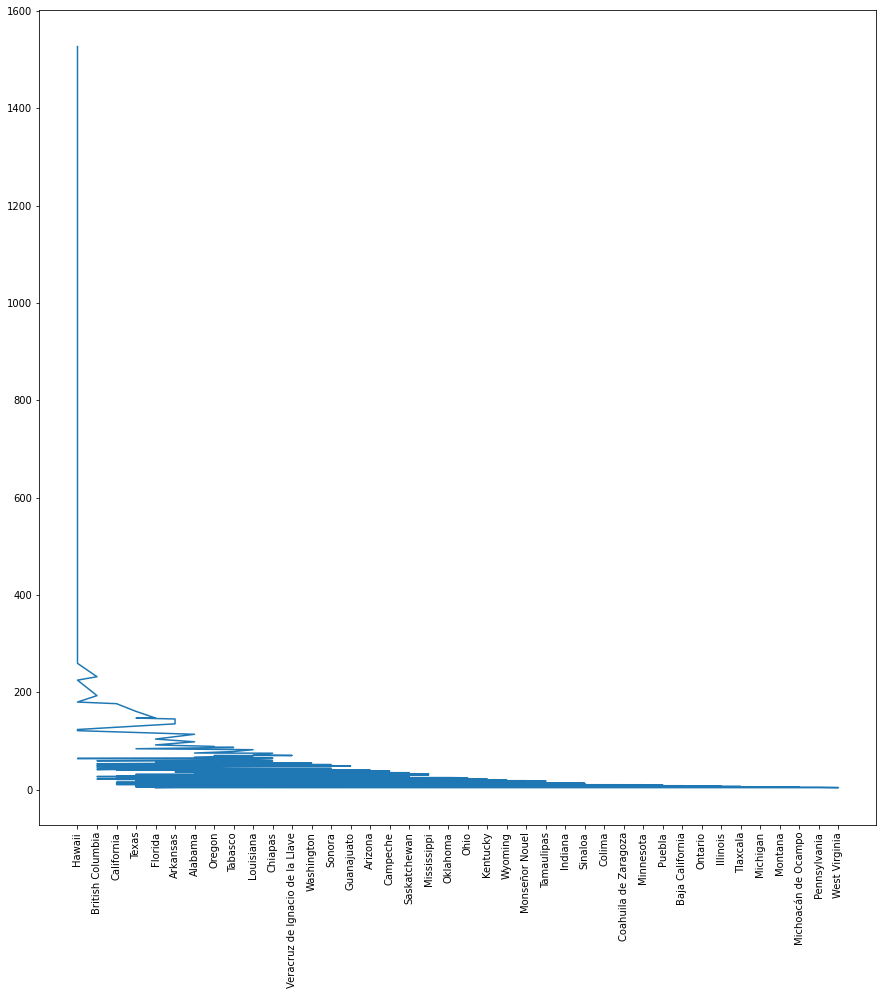

In [ ]:
plt.figure(figsize=(15,15))
plt.xticks(rotation = 90)
plt.plot(df5['state'], df5['frp'])

In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(forest_fire_df, lat='latitude', lon='longitude', color="confidence", hover_data=['frp', 'brightness'])
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [ ]:
fig = px.histogram(forest_fire_df, x='latitude', y='longitude', color='satellite', hover_data=forest_fire_df.columns, template='seaborn')
fig.show()

## **Modelling**

In [ ]:
#Drop unwanted fields
y = forest_fire_df['confidence']
comp = forest_fire_df.drop(['confidence', 'acq_date', 'acq_time', 'bright_t31', 'brightness', 'satellite', 'daynight','version','track','name_match'], axis = 1)

In [ ]:
#Describe the data after dropping 
comp.describe()


Plot the heatmap after data cleaning process

In [ ]:
plt.figure(figsize=(7, 7))
sns.heatmap(comp.corr(),annot=True,cmap='viridis',linewidths=.5)

## Splitting Data for training and testing

In [ ]:
Xtrain, Xtest, ytrain, ytest = train_test_split(comp.iloc[:, :50000], y, test_size=0.2)

Create RandomForestRegressor model

In [ ]:
random_model = RandomForestRegressor(n_estimators=300, random_state = 42, n_jobs = -1)

In [ ]:
#Fit
random_model.fit(Xtrain, ytrain)


Predict the model

In [ ]:
y_result = random_model.predict(Xtest)
print(y_result)

Check the accuracy

In [ ]:
#Checking the accuracy
random_model_accuracy = round(random_model.score(Xtrain, ytrain)*100,2)
print(round(random_model_accuracy, 2), '%')

Test the model

In [ ]:
# Dump the model into pickle file
import pickle
with open('model.pickle', 'wb') as f:
    pickle.dump(random_model, f)

In [ ]:
#Fine tune the parameters and check for accuracy 
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(RandomForestRegressor(), comp.iloc[:, :500], y, cv=cv)

# **References**

Sources: 

* Here
* Here

Alternate approaches

In [ ]:
# X_data=df.drop(['confidence', 'acq_date', 'acq_time', 'bright_t31', 'brightness', 'satellite', 'daynight','version','track'], axis = 1)
# y_data=df['confidence']
# test_size = 0.4
# X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=test_size)

In [ ]:
# y_train=y_train.values.reshape(y_train.size,1)

In [ ]:
# def rec(m,n,tol):
#     if type(m)!='numpy.ndarray':
#         m=np.array(m)
#     if type(n)!='numpy.ndarray':
#         n=np.array(n)
#     l=m.size
#     percent = 0
#     for i in range(l):
#         if np.abs(10**m[i]-10**n[i])<=tol:
#             percent+=1
#     return 100*(percent/l)

In [ ]:
# tol_max=20

In [ ]:
# scaler = StandardScaler()

In [ ]:
# param_grid = {'C': [0.01,0.1,1, 10], 'epsilon': [10,1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']}

In [ ]:
# grid_SVR = GridSearchCV(SVR(),param_grid,refit=True,verbose=0,cv=5)
# grid_SVR.fit(scaler.fit_transform(X_train),scaler.fit_transform(y_train))

In [ ]:
# tree_model = DecisionTreeRegressor(max_depth=10,criterion='mae')
# tree_model.fit(scaler.fit_transform(X_train),scaler.fit_transform(y_train))

In [ ]:
# tree_model.score(X_test,y_test)

In [ ]:
# tree_model = DecisionTreeRegressor(max_depth=10,criterion='mae')
# tree_model.fit((Xtrain),(ytrain))

In [ ]:
# res_pred = tree_model.predict(Xtest)
# tree_model.score(Xtrain,ytrain)*100
# # score = accuracy_score(X_test, y_test)

# **Alternative Solutions**

In [ ]:
# df_new = pd.read_csv('./forestfires.csv')
# df_new.info()
# df_new.describe()
# df_new.isna().sum()
# unique_values(df_new)
# df_new['Log-area']=np.log10(df_new['area']+1)
# for i in df_new.describe().columns[:-2]:
#     df_new.plot.scatter(i,'Log-area',grid=True)